Model
- NAFNet

Architect
- enc_blks = [1, 1, 1, 28]
- middle_blk_num = 1
- dec_blks = [1, 1, 1, 1]

CONFIG
- Learning rate = 1e-3
- Batch size    = 8

Augmentation
- Horizontal Flip
- Vertical Flip

 Performance
- epoch : 60   
- Loss: 56.24465560913086
- PSNR: 43.75534439086914
- SSIM: 0.986481249332428

In [1]:
!pip install gdown

In [2]:
pip install torch-summary

Note: you may need to restart the kernel to use updated packages.


In [3]:
import gdown
import numpy as np
import albumentations as A
import matplotlib.pyplot as plt
!pip install ptflops
from ptflops import get_model_complexity_info
import torch
import torch.nn as nn
import torch.nn.functional as F
import os
from PIL import Image
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms
from tqdm import tqdm
import matplotlib.pyplot as plt
import torch.nn.functional as F
!pip install torchmetrics
# import torch_xla.core.xla_model as xm
# import torch_xla.distributed.parallel_loader as pl
# import torch_xla.distributed.xla_multiprocessing as xmp

In [4]:
torch.manual_seed(42)
np.random.seed(42)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [5]:
gdown.download_folder(id='1hlMr2ruSB3sO_5hFJvqOJUdm4yIpu3mN', output='/content/')

Retrieving folder contents


Processing file 1jg8Dv4zCB_s2ZpIqsYrluM0cTSUNBTHv gt_images_128.npy
Processing file 1sM1f0TDuDrNmluncRhnMXn99n68dK7vb gt_images_256.npy
Processing file 1bC9eW_JB9MMoZSvpPGpY6VP4EXAFa2CU gt_images.npy
Processing file 1OuSWA9aryPFNfeOndSHrUy1mQ2ddiV-R noisy_images_128.npy
Processing file 1LUHfeNh9iGFwSr-90fIxhEsx6uAxamRc noisy_images_256.npy
Processing file 1fsK8dwIh33N58wrwNe-Kf0ZT2e1znl6Q noisy_images.npy


Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=1jg8Dv4zCB_s2ZpIqsYrluM0cTSUNBTHv
To: /content/SIDD/gt_images_128.npy
100%|██████████| 62.9M/62.9M [00:00<00:00, 228MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1sM1f0TDuDrNmluncRhnMXn99n68dK7vb
From (redirected): https://drive.google.com/uc?id=1sM1f0TDuDrNmluncRhnMXn99n68dK7vb&confirm=t&uuid=1b98267e-4785-4105-99ec-41829ac1fe57
To: /content/SIDD/gt_images_256.npy
100%|██████████| 126M/126M [00:00<00:00, 128MB/s]  
Downloading...
From (original): https://drive.google.com/uc?id=1bC9eW_JB9MMoZSvpPGpY6VP4EXAFa2CU
From (redirected): https://drive.google.com/uc?id=1bC9eW_JB9MMoZSvpPGpY6VP4EXAFa2CU&confirm=t&uuid=9695a155-c70d-4f5c-9d2e-e51dc7ffc988
To: /content/SIDD/gt_images.npy
100%|██████████| 252M/252M [00:01<00:00, 136MB/s]  
Downloading...
From: https://drive.google.com/uc?id=1OuSWA9aryPFNfeOndSHrUy1mQ2ddiV

['/content/SIDD/gt_images_128.npy',
 '/content/SIDD/gt_images_256.npy',
 '/content/SIDD/gt_images.npy',
 '/content/SIDD/noisy_images_128.npy',
 '/content/SIDD/noisy_images_256.npy',
 '/content/SIDD/noisy_images.npy']

In [6]:
# gdown.download_folder(id='1lWazkj3fm8eBN77qJ302-jsmxNmaXA_v', output='/content/')

In [7]:
noisy_images = np.load('/content/SIDD/noisy_images_256.npy')
gt_images = np.load('/content/SIDD/gt_images_256.npy')

In [8]:
# noisy_images = np.load('/content/cbsd/noise_25.npy')
# gt_images = np.load('/content/cbsd/gt_images.npy')

In [9]:
gt_images.shape

(160, 3, 256, 256)

In [10]:
noisy_images.shape

(160, 3, 256, 256)

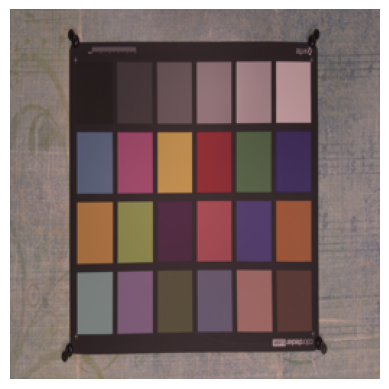

In [11]:
image = gt_images[1]
img = image.transpose(1, 2, 0)  # (C, H, W) -> (H, W, C)
plt.imshow(img)
plt.axis('off')
plt.show()

In [12]:
indices = np.arange(len(noisy_images))
np.random.shuffle(indices)

# Use the same shuffled indices for shuffling both arrays
noisy_images = noisy_images[indices]
gt_images = gt_images[indices]

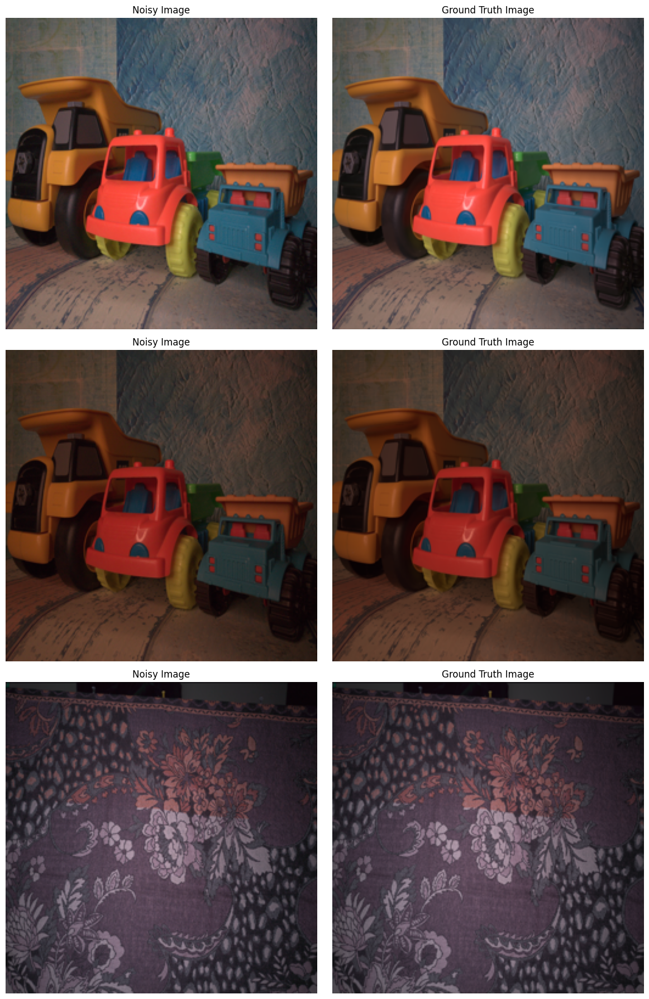

In [13]:
num_images_to_display = 3

plt.figure(figsize=(12, 6*num_images_to_display))

# Permute axis for each image pair before displaying
for i in range(num_images_to_display):
    # Permute axis for noisy image
    noisy_image_permuted = np.transpose(noisy_images[i], (1, 2, 0))
    
    # Permute axis for ground truth image
    gt_image_permuted = np.transpose(gt_images[i], (1, 2, 0))
    
    # Plot noisy image
    plt.subplot(num_images_to_display, 2, i*2 + 1)
    plt.imshow(noisy_image_permuted)
    plt.title("Noisy Image")
    plt.axis('off')
    
    # Plot ground truth image
    plt.subplot(num_images_to_display, 2, i*2 + 2)
    plt.imshow(gt_image_permuted)
    plt.title("Ground Truth Image")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [14]:
np.max(noisy_images)

1.0

In [15]:
length = len(noisy_images)
train = int(length * 0.8)
val = int(length * 0.9)
print(length, train, val)

160 128 144


In [16]:
# ------------------------------------------------------------------------
# Copyright (c) 2022 megvii-model. All Rights Reserved.
# ------------------------------------------------------------------------

'''
Simple Baselines for Image Restoration

@article{chen2022simple,
  title={Simple Baselines for Image Restoration},
  author={Chen, Liangyu and Chu, Xiaojie and Zhang, Xiangyu and Sun, Jian},
  journal={arXiv preprint arXiv:2204.04676},
  year={2022}
}
'''

'\nSimple Baselines for Image Restoration\n\n@article{chen2022simple,\n  title={Simple Baselines for Image Restoration},\n  author={Chen, Liangyu and Chu, Xiaojie and Zhang, Xiangyu and Sun, Jian},\n  journal={arXiv preprint arXiv:2204.04676},\n  year={2022}\n}\n'

In [17]:
class LayerNormFunction(torch.autograd.Function):

    @staticmethod
    def forward(ctx, x, weight, bias, eps):
        ctx.eps = eps
        N, C, H, W = x.size()
        mu = x.mean(1, keepdim=True)
        var = (x - mu).pow(2).mean(1, keepdim=True)
        y = (x - mu) / (var + eps).sqrt()
        ctx.save_for_backward(y, var, weight)
        y = weight.view(1, C, 1, 1) * y + bias.view(1, C, 1, 1)
        return y

    @staticmethod
    def backward(ctx, grad_output):
        eps = ctx.eps

        N, C, H, W = grad_output.size()
        y, var, weight = ctx.saved_variables
        g = grad_output * weight.view(1, C, 1, 1)
        mean_g = g.mean(dim=1, keepdim=True)

        mean_gy = (g * y).mean(dim=1, keepdim=True)
        gx = 1. / torch.sqrt(var + eps) * (g - y * mean_gy - mean_g)
        return gx, (grad_output * y).sum(dim=3).sum(dim=2).sum(dim=0), grad_output.sum(dim=3).sum(dim=2).sum(
            dim=0), None

class LayerNorm2d(nn.Module):

    def __init__(self, channels, eps=1e-6):
        super(LayerNorm2d, self).__init__()
        self.register_parameter('weight', nn.Parameter(torch.ones(channels)))
        self.register_parameter('bias', nn.Parameter(torch.zeros(channels)))
        self.eps = eps

    def forward(self, x):
        return LayerNormFunction.apply(x, self.weight, self.bias, self.eps)


def replace_layers(model, base_size, train_size, fast_imp, **kwargs):
    for n, m in model.named_children():
        if len(list(m.children())) > 0:
            ## compound module, go inside it
            replace_layers(m, base_size, train_size, fast_imp, **kwargs)

        if isinstance(m, nn.AdaptiveAvgPool2d):
            pool = AvgPool2d(base_size=base_size, fast_imp=fast_imp, train_size=train_size)
            assert m.output_size == 1
            setattr(model, n, pool)


'''
ref.
@article{chu2021tlsc,
  title={Revisiting Global Statistics Aggregation for Improving Image Restoration},
  author={Chu, Xiaojie and Chen, Liangyu and and Chen, Chengpeng and Lu, Xin},
  journal={arXiv preprint arXiv:2112.04491},
  year={2021}
}
'''
class Local_Base():
    def convert(self, *args, train_size, **kwargs):
        replace_layers(self, *args, train_size=train_size, **kwargs)
        imgs = torch.rand(train_size)
        with torch.no_grad():
            self.forward(imgs)

class SimpleGate(nn.Module):
    def forward(self, x):
        x1, x2 = x.chunk(2, dim=1)
        return x1 * x2

class NAFBlock(nn.Module):
    def __init__(self, c, DW_Expand=2, FFN_Expand=2, drop_out_rate=0.):
        super().__init__()
        dw_channel = c * DW_Expand
        self.conv1 = nn.Conv2d(in_channels=c, out_channels=dw_channel, kernel_size=1, padding=0, stride=1, groups=1, bias=True)
        self.conv2 = nn.Conv2d(in_channels=dw_channel, out_channels=dw_channel, kernel_size=3, padding=1, stride=1, groups=dw_channel,
                               bias=True)
        self.conv3 = nn.Conv2d(in_channels=dw_channel // 2, out_channels=c, kernel_size=1, padding=0, stride=1, groups=1, bias=True)

        # Simplified Channel Attention
        self.sca = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(in_channels=dw_channel // 2, out_channels=dw_channel // 2, kernel_size=1, padding=0, stride=1,
                      groups=1, bias=True),
        )

        # SimpleGate
        self.sg = SimpleGate()

        ffn_channel = FFN_Expand * c
        self.conv4 = nn.Conv2d(in_channels=c, out_channels=ffn_channel, kernel_size=1, padding=0, stride=1, groups=1, bias=True)
        self.conv5 = nn.Conv2d(in_channels=ffn_channel // 2, out_channels=c, kernel_size=1, padding=0, stride=1, groups=1, bias=True)

        self.norm1 = LayerNorm2d(c)
        self.norm2 = LayerNorm2d(c)

        self.dropout1 = nn.Dropout(drop_out_rate) if drop_out_rate > 0. else nn.Identity()
        self.dropout2 = nn.Dropout(drop_out_rate) if drop_out_rate > 0. else nn.Identity()

        self.beta = nn.Parameter(torch.zeros((1, c, 1, 1)), requires_grad=True)
        self.gamma = nn.Parameter(torch.zeros((1, c, 1, 1)), requires_grad=True)

    def forward(self, inp):
        x = inp

        x = self.norm1(x)

        x = self.conv1(x)
        x = self.conv2(x)
        x = self.sg(x)
        x = x * self.sca(x)
        x = self.conv3(x)

        x = self.dropout1(x)

        y = inp + x * self.beta

        x = self.conv4(self.norm2(y))
        x = self.sg(x)
        x = self.conv5(x)

        x = self.dropout2(x)

        return y + x * self.gamma

class HalfUNet(nn.Module):
    def __init__(self, input_channels=3):
        super(HalfUNet, self).__init__()
        self.initial = nn.Conv2d(3, 64, 1, 1)
        self.conv1 = nn.Sequential(
            NAFBlock(64)
        )
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Sequential(
            NAFBlock(64)
        )
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv3 = nn.Sequential(
            NAFBlock(64)
        )

        self.conv_up3 = nn.Conv2d(64, 64 * 16, 1, bias=False)
        self.up3 = nn.PixelShuffle(4)
        self.conv_up2 = nn.Conv2d(64, 64 * 4, 1, bias=False)
        self.up2 = nn.PixelShuffle(2)
        self.final_conv = nn.Conv2d(64, 3, kernel_size=1)
        # If you want to perform multi-class segmentation, change the output channels to the desired number

    def forward(self, x):
        x = self.initial(x)
        x1 = self.conv1(x)
        pool1 = self.pool1(x1)
        x2 = self.conv2(pool1)
        pool2 = self.pool2(x2)
        x3 = self.conv3(pool2)

        up3 = self.conv_up3(x3)
        up3 = self.up3(up3)

        up2 = self.conv_up2(x2)
        up2 = self.up2(up2)
        up_scaled = x1 + up2 + up3
        output = self.final_conv(up_scaled)
        return output


class NAFNet(nn.Module):

    def __init__(self, img_channel=3, width=32, middle_blk_num=1, enc_blk_nums=[], dec_blk_nums=[]):
        super().__init__()

        self.intro = nn.Conv2d(in_channels=img_channel, out_channels=width, kernel_size=3, padding=1, stride=1, groups=1,
                              bias=True)
        self.ending = nn.Conv2d(in_channels=width, out_channels=img_channel, kernel_size=3, padding=1, stride=1, groups=1,
                              bias=True)    # 최종적으로는 채널 3으로 나가야하니깐.

        self.encoders = nn.ModuleList()
        self.decoders = nn.ModuleList()
        self.middle_blks = nn.ModuleList()
        self.ups = nn.ModuleList()
        self.downs = nn.ModuleList()
        #------------------------------------------------------------------#
        self.fftBlock = nn.ModuleList() 
        #------------------------------------------------------------------#

        chan = width
        
        for num in enc_blk_nums:
            self.encoders.append(
                nn.Sequential(
                    *[NAFBlock(chan) for _ in range(num)]
                )
            )
            self.downs.append(
                nn.Conv2d(chan, 2*chan, 2, 2)
            )
            chan = chan * 2

        
        self.middle_blks = \
            nn.Sequential(
                *[NAFBlock(chan) for _ in range(middle_blk_num)]
            )

        for num in dec_blk_nums:
            self.ups.append(
                nn.Sequential(
                    nn.Conv2d(chan, chan*2, kernel_size=1, bias=False),   # point-wise conv. 채널 수 2배 뻥튀기
                    
                    nn.PixelShuffle(upscale_factor=2)   # Feature map의 수많은 channel을 이용하여, pixel 위치에 맞는 각 Channel의 값을 떼어와서 feature map 확장  # 논문 참고 (https://mole-starseeker.tistory.com/m/84)
                                                        # 이미지를 가로 세로 2배씩 확장한다면, 채널은 4개가 필요함 // 따라서 채널이 upscale_factor ** 2 만큼 감소
                )
            )
            chan = chan // 2    # 채널 수 다시 2배 감소
            self.decoders.append(
                nn.Sequential(
                    *[NAFBlock(chan) for _ in range(num)]
                )
            )


        self.padder_size = 2 ** len(self.encoders)  # == len(enc_blk_nums) == 4, down으로 인해 감소된 배수

    def forward(self, inp):
        B, C, H, W = inp.shape
        inp = self.check_image_size(inp)

        x = self.intro(inp)

        encs = []

        for encoder, down in zip(self.encoders, self.downs):
            x = encoder(x)
            encs.append(x)
            x = down(x)

        x = self.middle_blks(x)

        for decoder, up, enc_skip in zip(self.decoders, self.ups, encs[::-1]):
            x = up(x)
            x = x + enc_skip
            x = decoder(x)

        
        x = self.ending(x)
        x = x + inp

        return x[:, :, :H, :W]

    def check_image_size(self, x):
        _, _, h, w = x.size()
        mod_pad_h = (self.padder_size - h % self.padder_size) % self.padder_size
        mod_pad_w = (self.padder_size - w % self.padder_size) % self.padder_size
        x = F.pad(x, (0, mod_pad_w, 0, mod_pad_h))
        return x


# Example usage:
input_tensor = torch.randn(1, 3, 256, 256)  # Example input tensor
# model = HalfUNet()
model = NAFNet()
output_tensor = model(input_tensor)
print(output_tensor.shape)  # Print the shape of the output tensor

torch.Size([1, 3, 256, 256])


In [18]:
# 설정 변경 
if __name__ == '__main__':
    img_channel = 3
    width = 32

    # enc_blks = [2, 2, 4, 8]
    # middle_blk_num = 12
    # dec_blks = [2, 2, 2, 2]

    # enc_blks = [1, 1, 1, 1]
    # middle_blk_num = 1
    # dec_blks = [1, 1, 1, 1]

    # NAFNet 기본 config
    enc_blks = [1, 1, 1, 28]
    middle_blk_num = 1
    dec_blks = [1, 1, 1, 1]

    model = NAFNet(img_channel=img_channel, width=width, middle_blk_num=middle_blk_num,
                      enc_blk_nums=enc_blks, dec_blk_nums=dec_blks)


    inp_shape = (3, 256, 256)

In [19]:
model = model.to(device)

In [20]:
from torchsummary import summary
result = summary(model, (3, 256 ,256))

Layer (type:depth-idx)                        Output Shape              Param #
├─Conv2d: 1-1                                 [-1, 32, 256, 256]        896
├─ModuleList: 1                               []                        --
|    └─Sequential: 2-1                        [-1, 32, 256, 256]        --
|    |    └─NAFBlock: 3-1                     [-1, 32, 256, 256]        8,224
├─ModuleList: 1                               []                        --
|    └─Conv2d: 2-2                            [-1, 64, 128, 128]        8,256
├─ModuleList: 1                               []                        --
|    └─Sequential: 2-3                        [-1, 64, 128, 128]        --
|    |    └─NAFBlock: 3-2                     [-1, 64, 128, 128]        30,784
├─ModuleList: 1                               []                        --
|    └─Conv2d: 2-4                            [-1, 128, 64, 64]         32,896
├─ModuleList: 1                               []                        --
|    

In [22]:
class ImageDataset(Dataset):
    def __init__(self, noise, gt):
        # Transforms for low resolution images and high resolution images
        self.noise = noise
        self.gt = gt

    def __getitem__(self, index):
        noise = self.noise[index % len(self.noise)]

        gt =self.gt[index % len(self.gt)]

        return (noise, gt)

    def __len__(self):
        return len(self.noise)

In [23]:
noisy_images[:train].shape

(128, 3, 256, 256)

In [23]:
# sidd
# noisy_train, gt_train = noisy_images[:train].transpose(0,2,3,1), gt_images[:train].transpose(0,2,3,1)
# noisy_test, gt_test = noisy_images[train:], gt_images[train:]

# del noisy_images
# del gt_images

In [24]:
noisy_train, gt_train = noisy_images[:train].transpose(0,2,3,1), gt_images[:train].transpose(0,2,3,1)
noisy_val, gt_val =  noisy_images[train:val], gt_images[train:val]
noisy_test, gt_test = noisy_images[val:], gt_images[val:]

del noisy_images
del gt_images

In [25]:
print(noisy_train.shape)
print(gt_train.shape)
print(noisy_val.shape)
print(gt_val.shape)
print(noisy_test.shape)
print(gt_test.shape)

(128, 256, 256, 3)
(128, 256, 256, 3)
(16, 3, 256, 256)
(16, 3, 256, 256)
(16, 3, 256, 256)
(16, 3, 256, 256)


In [26]:
horizontal_flip = A.Compose([
    A.HorizontalFlip(p=1)
])

noisy_train_horizontal = []
gt_train_horizontal = []

for i in range(len(noisy_train)):
    augmented = horizontal_flip(image=noisy_train[i])
    noisy_train_horizontal.append(augmented['image'])

    augmented = horizontal_flip(image=gt_train[i])
    gt_train_horizontal.append(augmented['image'])

noisy_train_horizontal = np.array(noisy_train_horizontal)
gt_train_horizontal = np.array(gt_train_horizontal)
gt_train_horizontal.shape

(128, 256, 256, 3)

In [27]:
vertical_flip = A.Compose([
    A.VerticalFlip(p=1)
])

noisy_train_vertical = []
gt_train_vertical = []

for i in range(len(noisy_train)):
    augmented = vertical_flip(image=noisy_train[i])
    noisy_train_vertical.append(augmented['image'])

    augmented = vertical_flip(image=gt_train[i])
    gt_train_vertical.append(augmented['image'])

noisy_train_vertical = np.array(noisy_train_vertical)
gt_train_vertical = np.array(gt_train_vertical)
gt_train_vertical.shape

(128, 256, 256, 3)

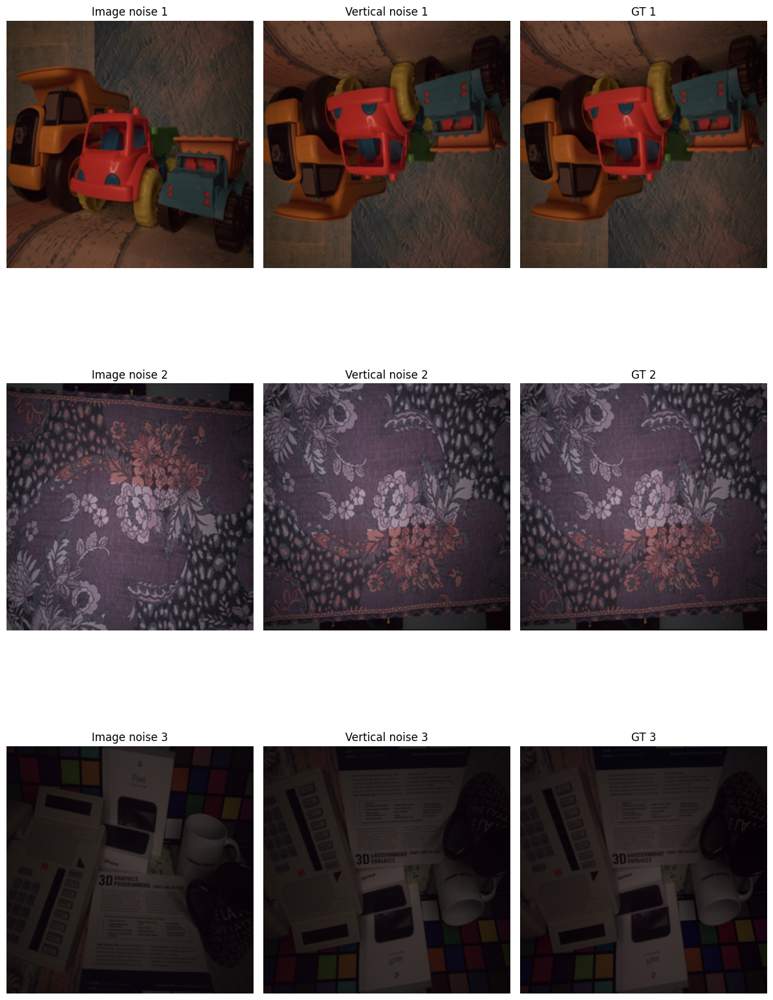

In [28]:
num_images_to_display = 3

plt.figure(figsize=(12, 6*num_images_to_display))  # Adjust the figure size as needed

for i in range(num_images_to_display):
    plt.subplot(num_images_to_display, 3, 3*i+1)
    plt.imshow(noisy_train[i+1])
    plt.title('Image noise {}'.format(i+1))
    plt.axis('off')

    plt.subplot(num_images_to_display, 3, 3*i+2)
    plt.imshow(noisy_train_vertical[i+1])
    plt.title('Vertical noise {}'.format(i+1))
    plt.axis('off')

    plt.subplot(num_images_to_display, 3, 3*i+3)
    plt.imshow(gt_train_vertical[i+1])
    plt.title('GT {}'.format(i+1))
    plt.axis('off')

plt.tight_layout()
plt.show()

In [29]:
# noisy_vertical + noisy_horizontal
noisy_train = np.vstack((noisy_train, noisy_train_vertical, noisy_train_horizontal)).transpose(0, 3, 1, 2)
gt_train = np.vstack((gt_train, gt_train_vertical, gt_train_horizontal)).transpose(0, 3, 1, 2)

print(noisy_train.shape)
print(gt_train.shape)

print(noisy_train.dtype)
print(gt_train.dtype)

(384, 3, 256, 256)
(384, 3, 256, 256)
float32
float32


In [30]:
train_dataloader = DataLoader(ImageDataset(noisy_train, gt_train), batch_size=8, shuffle=True, num_workers=4)
val_dataloader = DataLoader(ImageDataset(noisy_val, gt_val), batch_size=8, shuffle=True, num_workers=4)
test_dataloader = DataLoader(ImageDataset(noisy_test, gt_test), batch_size=8, shuffle=True, num_workers=4)

In [31]:
from torchmetrics.image import StructuralSimilarityIndexMeasure

# device = xm.xla_device()
ssim = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

def psnr(img1, img2, data_range=1.0):
    """
    Compute Peak Signal-to-Noise Ratio (PSNR) between two images.

    Args:
        img1 (torch.Tensor): Input image tensor, shape (batch_size, channels, height, width).
        img2 (torch.Tensor): Input image tensor, shape (batch_size, channels, height, width).
        data_range (float): Range of valid pixel values in the image. Default is 1.0.

    Returns:
        torch.Tensor: PSNR value, shape (batch_size,)
    """
    mse = F.mse_loss(img1, img2)
    psnr_val = 20 * torch.log10(data_range / torch.sqrt(mse))
    return psnr_val

def loss_func(x,y):
    return 100-psnr(x,y)

# loss_func = nn.MSELoss()

In [32]:
def evaluate_model(model, dataloader, devic=device):
    model.eval()
    total_loss = 0.0
    total_psnr = 0.0
    total_ssim = 0.0

    with torch.no_grad():
        for inputs, targets in dataloader:
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            outputs = model(inputs)

            # Compute metrics
            loss_val = loss_func(outputs, targets)
            psnr_val = psnr(outputs, targets)
            ssim_val = ssim(outputs, targets)

            total_loss += loss_val.item()
            total_psnr += psnr_val.item()
            total_ssim += ssim_val.item()

    avg_loss = total_loss/ len(dataloader)
    avg_psnr = total_psnr / len(dataloader)
    avg_ssim = total_ssim / len(dataloader)

    return avg_loss, avg_psnr, avg_ssim

# Train

In [33]:
# model.to(device)

train_loss = []
train_psnr = []
train_ssim = []
val_loss = []
val_psnr = []
val_ssim = []

# Define optimizer and scheduler
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

# Training loop
num_epochs = 60
for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    model.train()

    total_loss = 0.0
    total_psnr = 0.0
    total_ssim = 0.0

    loop = tqdm(enumerate(train_dataloader), total=len(train_dataloader))
    for batch_idx, (inputs, targets) in loop:
        inputs, targets = inputs.to(device), targets.to(device)

        # Forward pass
        outputs = model(inputs)

        # Compute loss
        loss = loss_func(outputs, targets)
        psnr_val = psnr(outputs, targets)
        ssim_val = ssim(outputs,targets)

        total_loss += loss.item()
        total_psnr += psnr_val.item()
        total_ssim += ssim_val.item()

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Print training progress
        loop.set_description(f'Step [{batch_idx+1}/{len(train_dataloader)}]')
        loop.set_postfix(loss=loss.item(), psnr=psnr_val.item(), ssim=ssim_val.item())

#     scheduler.step()

    avg_loss = total_loss / len(train_dataloader)
    avg_psnr = total_psnr / len(train_dataloader)
    avg_ssim = total_ssim / len(train_dataloader)

    print(f"Avg Loss: {avg_loss:.4f}, Avg PSNR: {avg_psnr:.4f}, Avg SSIM: {avg_ssim:.4f}")

    # Evaluate the model on the test set
    avg_loss_val, avg_psnr_val, avg_ssim_val = evaluate_model(model, val_dataloader, device)
    print(f"Val Loss: {avg_loss_val}, Val PSNR: {avg_psnr_val:.4f}, Val SSIM: {avg_ssim_val:.4f}")

    train_loss.append(avg_loss)
    train_psnr.append(avg_psnr)
    train_ssim.append(avg_ssim)
    val_loss.append(avg_loss_val)
    val_psnr.append(avg_psnr_val)
    val_ssim.append(avg_ssim_val)


# Save trained model
torch.save(model.state_dict(), 'swinir_model.pth')

Epoch 1/60


  0%|          | 0/48 [00:00<?, ?it/s]/tmp/ipykernel_35/759815801.py:19: DeprecationWarning: 'saved_variables' is deprecated; use 'saved_tensors'
  y, var, weight = ctx.saved_variables
Step [48/48]: 100%|██████████| 48/48 [00:22<00:00,  2.16it/s, loss=65.3, psnr=34.7, ssim=0.952]

Avg Loss: 66.7965, Avg PSNR: 33.2035, Avg SSIM: 0.9184


Val Loss: 63.70706748962402, Val PSNR: 36.2929, Val SSIM: 0.9460
Epoch 2/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=63.2, psnr=36.8, ssim=0.974]

Avg Loss: 64.0475, Avg PSNR: 35.9525, Avg SSIM: 0.9605


Val Loss: 64.16974639892578, Val PSNR: 35.8303, Val SSIM: 0.9531
Epoch 3/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=63.2, psnr=36.8, ssim=0.972]

Avg Loss: 62.7022, Avg PSNR: 37.2978, Avg SSIM: 0.9655


Val Loss: 62.4117431640625, Val PSNR: 37.5883, Val SSIM: 0.9608
Epoch 4/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=62.8, psnr=37.2, ssim=0.966]

Avg Loss: 63.0425, Avg PSNR: 36.9575, Avg SSIM: 0.9674


Val Loss: 62.06002235412598, Val PSNR: 37.9400, Val SSIM: 0.9653
Epoch 5/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=61.2, psnr=38.8, ssim=0.984]

Avg Loss: 61.4558, Avg PSNR: 38.5442, Avg SSIM: 0.9734


Val Loss: 62.149553298950195, Val PSNR: 37.8504, Val SSIM: 0.9704
Epoch 6/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=64.6, psnr=35.4, ssim=0.982]

Avg Loss: 61.6653, Avg PSNR: 38.3347, Avg SSIM: 0.9762


Val Loss: 62.02536201477051, Val PSNR: 37.9746, Val SSIM: 0.9740
Epoch 7/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=62.1, psnr=37.9, ssim=0.99] 

Avg Loss: 61.3125, Avg PSNR: 38.6875, Avg SSIM: 0.9783


Val Loss: 61.52544593811035, Val PSNR: 38.4746, Val SSIM: 0.9758
Epoch 8/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=62.8, psnr=37.2, ssim=0.978]

Avg Loss: 61.1515, Avg PSNR: 38.8485, Avg SSIM: 0.9794


Val Loss: 60.97422790527344, Val PSNR: 39.0258, Val SSIM: 0.9761
Epoch 9/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=60.7, psnr=39.3, ssim=0.987]

Avg Loss: 61.1644, Avg PSNR: 38.8356, Avg SSIM: 0.9795


Val Loss: 61.53508758544922, Val PSNR: 38.4649, Val SSIM: 0.9767
Epoch 10/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=62.4, psnr=37.6, ssim=0.975]

Avg Loss: 60.7339, Avg PSNR: 39.2661, Avg SSIM: 0.9802


Val Loss: 60.04536437988281, Val PSNR: 39.9546, Val SSIM: 0.9774
Epoch 11/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.22it/s, loss=58.2, psnr=41.8, ssim=0.989]

Avg Loss: 60.7044, Avg PSNR: 39.2956, Avg SSIM: 0.9808


Val Loss: 59.40330505371094, Val PSNR: 40.5967, Val SSIM: 0.9796
Epoch 12/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.24it/s, loss=62, psnr=38, ssim=0.98]     

Avg Loss: 60.1064, Avg PSNR: 39.8936, Avg SSIM: 0.9812


Val Loss: 58.858924865722656, Val PSNR: 41.1411, Val SSIM: 0.9787
Epoch 13/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=63, psnr=37, ssim=0.975]    

Avg Loss: 59.6996, Avg PSNR: 40.3004, Avg SSIM: 0.9819


Val Loss: 59.0434684753418, Val PSNR: 40.9565, Val SSIM: 0.9798
Epoch 14/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=58.1, psnr=41.9, ssim=0.984]

Avg Loss: 59.7238, Avg PSNR: 40.2762, Avg SSIM: 0.9810


Val Loss: 58.24059295654297, Val PSNR: 41.7594, Val SSIM: 0.9781
Epoch 15/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=77.8, psnr=22.2, ssim=0.379] 

Avg Loss: 73.7416, Avg PSNR: 26.2584, Avg SSIM: 0.5338


Val Loss: 77.29644012451172, Val PSNR: 22.7036, Val SSIM: 0.3265
Epoch 16/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=62.7, psnr=37.3, ssim=0.923]

Avg Loss: 72.6092, Avg PSNR: 27.3908, Avg SSIM: 0.5815


Val Loss: 62.82570838928223, Val PSNR: 37.1743, Val SSIM: 0.9535
Epoch 17/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.24it/s, loss=58, psnr=42, ssim=0.976]    

Avg Loss: 60.7171, Avg PSNR: 39.2829, Avg SSIM: 0.9713


Val Loss: 58.77009963989258, Val PSNR: 41.2299, Val SSIM: 0.9756
Epoch 18/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=62.7, psnr=37.3, ssim=0.962]

Avg Loss: 59.7532, Avg PSNR: 40.2468, Avg SSIM: 0.9791


Val Loss: 58.65874481201172, Val PSNR: 41.3413, Val SSIM: 0.9780
Epoch 19/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=59.1, psnr=40.9, ssim=0.984]

Avg Loss: 59.3735, Avg PSNR: 40.6265, Avg SSIM: 0.9802


Val Loss: 57.57779121398926, Val PSNR: 42.4222, Val SSIM: 0.9793
Epoch 20/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=54.8, psnr=45.2, ssim=0.99] 

Avg Loss: 59.3143, Avg PSNR: 40.6857, Avg SSIM: 0.9817


Val Loss: 58.23900604248047, Val PSNR: 41.7610, Val SSIM: 0.9803
Epoch 21/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=55.9, psnr=44.1, ssim=0.987]

Avg Loss: 59.2029, Avg PSNR: 40.7971, Avg SSIM: 0.9822


Val Loss: 57.95191192626953, Val PSNR: 42.0481, Val SSIM: 0.9806
Epoch 22/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=60.3, psnr=39.7, ssim=0.979]

Avg Loss: 59.2973, Avg PSNR: 40.7027, Avg SSIM: 0.9825


Val Loss: 59.74150466918945, Val PSNR: 40.2585, Val SSIM: 0.9795
Epoch 23/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=59.2, psnr=40.8, ssim=0.985]

Avg Loss: 58.9901, Avg PSNR: 41.0099, Avg SSIM: 0.9829


Val Loss: 58.22580528259277, Val PSNR: 41.7742, Val SSIM: 0.9816
Epoch 24/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=60.3, psnr=39.7, ssim=0.981]

Avg Loss: 59.1869, Avg PSNR: 40.8131, Avg SSIM: 0.9825


Val Loss: 57.96269607543945, Val PSNR: 42.0373, Val SSIM: 0.9797
Epoch 25/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=57.9, psnr=42.1, ssim=0.984]

Avg Loss: 58.5565, Avg PSNR: 41.4435, Avg SSIM: 0.9834


Val Loss: 57.42258644104004, Val PSNR: 42.5774, Val SSIM: 0.9808
Epoch 26/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.24it/s, loss=60, psnr=40, ssim=0.985]    

Avg Loss: 58.0625, Avg PSNR: 41.9375, Avg SSIM: 0.9838


Val Loss: 57.856924057006836, Val PSNR: 42.1431, Val SSIM: 0.9816
Epoch 27/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.24it/s, loss=55.5, psnr=44.5, ssim=0.986]

Avg Loss: 57.7840, Avg PSNR: 42.2160, Avg SSIM: 0.9844


Val Loss: 57.17778396606445, Val PSNR: 42.8222, Val SSIM: 0.9831
Epoch 28/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.24it/s, loss=58.6, psnr=41.4, ssim=0.982]

Avg Loss: 57.6173, Avg PSNR: 42.3827, Avg SSIM: 0.9846


Val Loss: 57.472551345825195, Val PSNR: 42.5274, Val SSIM: 0.9833
Epoch 29/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.22it/s, loss=56.4, psnr=43.6, ssim=0.99] 

Avg Loss: 57.5267, Avg PSNR: 42.4733, Avg SSIM: 0.9848


Val Loss: 56.94449424743652, Val PSNR: 43.0555, Val SSIM: 0.9836
Epoch 30/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.24it/s, loss=59.8, psnr=40.2, ssim=0.978]

Avg Loss: 57.4795, Avg PSNR: 42.5205, Avg SSIM: 0.9851


Val Loss: 57.42140579223633, Val PSNR: 42.5786, Val SSIM: 0.9834
Epoch 31/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=60.9, psnr=39.1, ssim=0.982]

Avg Loss: 57.9061, Avg PSNR: 42.0939, Avg SSIM: 0.9847


Val Loss: 58.11014175415039, Val PSNR: 41.8899, Val SSIM: 0.9821
Epoch 32/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=56.1, psnr=43.9, ssim=0.989]

Avg Loss: 57.3274, Avg PSNR: 42.6726, Avg SSIM: 0.9854


Val Loss: 57.049625396728516, Val PSNR: 42.9504, Val SSIM: 0.9839
Epoch 33/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=54.9, psnr=45.1, ssim=0.988]

Avg Loss: 57.1234, Avg PSNR: 42.8766, Avg SSIM: 0.9857


Val Loss: 56.62452697753906, Val PSNR: 43.3755, Val SSIM: 0.9844
Epoch 34/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=56.7, psnr=43.3, ssim=0.987]

Avg Loss: 56.9677, Avg PSNR: 43.0323, Avg SSIM: 0.9858


Val Loss: 56.95255088806152, Val PSNR: 43.0474, Val SSIM: 0.9832
Epoch 35/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=59.6, psnr=40.4, ssim=0.975]

Avg Loss: 57.2026, Avg PSNR: 42.7974, Avg SSIM: 0.9857


Val Loss: 56.61498260498047, Val PSNR: 43.3850, Val SSIM: 0.9845
Epoch 36/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=57.1, psnr=42.9, ssim=0.989]

Avg Loss: 57.1506, Avg PSNR: 42.8494, Avg SSIM: 0.9859


Val Loss: 56.382808685302734, Val PSNR: 43.6172, Val SSIM: 0.9845
Epoch 37/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=54.2, psnr=45.8, ssim=0.993]

Avg Loss: 56.7686, Avg PSNR: 43.2314, Avg SSIM: 0.9861


Val Loss: 56.269147872924805, Val PSNR: 43.7309, Val SSIM: 0.9848
Epoch 38/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=55.4, psnr=44.6, ssim=0.99] 

Avg Loss: 56.8376, Avg PSNR: 43.1624, Avg SSIM: 0.9864


Val Loss: 56.09415054321289, Val PSNR: 43.9058, Val SSIM: 0.9851
Epoch 39/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.22it/s, loss=58.8, psnr=41.2, ssim=0.99] 

Avg Loss: 57.0476, Avg PSNR: 42.9524, Avg SSIM: 0.9863


Val Loss: 56.23553657531738, Val PSNR: 43.7645, Val SSIM: 0.9843
Epoch 40/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=58.3, psnr=41.7, ssim=0.985]

Avg Loss: 57.0354, Avg PSNR: 42.9646, Avg SSIM: 0.9863


Val Loss: 56.24347496032715, Val PSNR: 43.7565, Val SSIM: 0.9846
Epoch 41/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=54.5, psnr=45.5, ssim=0.991]

Avg Loss: 56.5826, Avg PSNR: 43.4174, Avg SSIM: 0.9866


Val Loss: 56.5095329284668, Val PSNR: 43.4905, Val SSIM: 0.9853
Epoch 42/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.24it/s, loss=55.6, psnr=44.4, ssim=0.992]

Avg Loss: 56.5023, Avg PSNR: 43.4977, Avg SSIM: 0.9868


Val Loss: 56.32257080078125, Val PSNR: 43.6774, Val SSIM: 0.9852
Epoch 43/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=58.1, psnr=41.9, ssim=0.985]

Avg Loss: 56.4734, Avg PSNR: 43.5266, Avg SSIM: 0.9869


Val Loss: 57.21484184265137, Val PSNR: 42.7852, Val SSIM: 0.9843
Epoch 44/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=58.1, psnr=41.9, ssim=0.991]

Avg Loss: 56.8058, Avg PSNR: 43.1942, Avg SSIM: 0.9868


Val Loss: 55.768205642700195, Val PSNR: 44.2318, Val SSIM: 0.9849
Epoch 45/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.24it/s, loss=58.3, psnr=41.7, ssim=0.983]

Avg Loss: 56.2004, Avg PSNR: 43.7996, Avg SSIM: 0.9871


Val Loss: 55.846628189086914, Val PSNR: 44.1534, Val SSIM: 0.9858
Epoch 46/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=53.5, psnr=46.5, ssim=0.991]

Avg Loss: 56.5311, Avg PSNR: 43.4689, Avg SSIM: 0.9870


Val Loss: 56.003671646118164, Val PSNR: 43.9963, Val SSIM: 0.9858
Epoch 47/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=58.4, psnr=41.6, ssim=0.986]

Avg Loss: 56.5131, Avg PSNR: 43.4869, Avg SSIM: 0.9871


Val Loss: 56.311601638793945, Val PSNR: 43.6884, Val SSIM: 0.9854
Epoch 48/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.24it/s, loss=54.5, psnr=45.5, ssim=0.994]

Avg Loss: 56.3809, Avg PSNR: 43.6191, Avg SSIM: 0.9873


Val Loss: 56.89019966125488, Val PSNR: 43.1098, Val SSIM: 0.9853
Epoch 49/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=53.8, psnr=46.2, ssim=0.994]

Avg Loss: 56.2000, Avg PSNR: 43.8000, Avg SSIM: 0.9873


Val Loss: 56.22883987426758, Val PSNR: 43.7712, Val SSIM: 0.9858
Epoch 50/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=56.4, psnr=43.6, ssim=0.986]

Avg Loss: 56.0239, Avg PSNR: 43.9761, Avg SSIM: 0.9877


Val Loss: 56.118595123291016, Val PSNR: 43.8814, Val SSIM: 0.9859
Epoch 51/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.24it/s, loss=56.3, psnr=43.7, ssim=0.986]

Avg Loss: 56.0418, Avg PSNR: 43.9582, Avg SSIM: 0.9877


Val Loss: 55.76100158691406, Val PSNR: 44.2390, Val SSIM: 0.9861
Epoch 52/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=57.5, psnr=42.5, ssim=0.984]

Avg Loss: 56.1531, Avg PSNR: 43.8469, Avg SSIM: 0.9877


Val Loss: 56.259477615356445, Val PSNR: 43.7405, Val SSIM: 0.9859
Epoch 53/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.24it/s, loss=58, psnr=42, ssim=0.985]    

Avg Loss: 56.4011, Avg PSNR: 43.5989, Avg SSIM: 0.9878


Val Loss: 55.821285247802734, Val PSNR: 44.1787, Val SSIM: 0.9863
Epoch 54/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=55.5, psnr=44.5, ssim=0.987]

Avg Loss: 55.9186, Avg PSNR: 44.0814, Avg SSIM: 0.9881


Val Loss: 56.96858024597168, Val PSNR: 43.0314, Val SSIM: 0.9859
Epoch 55/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=54.1, psnr=45.9, ssim=0.994]

Avg Loss: 56.0876, Avg PSNR: 43.9124, Avg SSIM: 0.9881


Val Loss: 57.50196838378906, Val PSNR: 42.4980, Val SSIM: 0.9854
Epoch 56/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.24it/s, loss=57.9, psnr=42.1, ssim=0.981]

Avg Loss: 55.8716, Avg PSNR: 44.1284, Avg SSIM: 0.9882


Val Loss: 55.87606239318848, Val PSNR: 44.1239, Val SSIM: 0.9862
Epoch 57/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.22it/s, loss=57.2, psnr=42.8, ssim=0.992]

Avg Loss: 56.0781, Avg PSNR: 43.9219, Avg SSIM: 0.9881


Val Loss: 56.85088920593262, Val PSNR: 43.1491, Val SSIM: 0.9859
Epoch 58/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=57.7, psnr=42.3, ssim=0.984]

Avg Loss: 55.9021, Avg PSNR: 44.0979, Avg SSIM: 0.9882


Val Loss: 55.6135196685791, Val PSNR: 44.3865, Val SSIM: 0.9866
Epoch 59/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.24it/s, loss=55.1, psnr=44.9, ssim=0.992]

Avg Loss: 55.9693, Avg PSNR: 44.0307, Avg SSIM: 0.9884


Val Loss: 55.82624435424805, Val PSNR: 44.1738, Val SSIM: 0.9868
Epoch 60/60


Step [48/48]: 100%|██████████| 48/48 [00:21<00:00,  2.25it/s, loss=54.7, psnr=45.3, ssim=0.991]

Avg Loss: 55.7592, Avg PSNR: 44.2408, Avg SSIM: 0.9884


Val Loss: 55.580976486206055, Val PSNR: 44.4190, Val SSIM: 0.9871


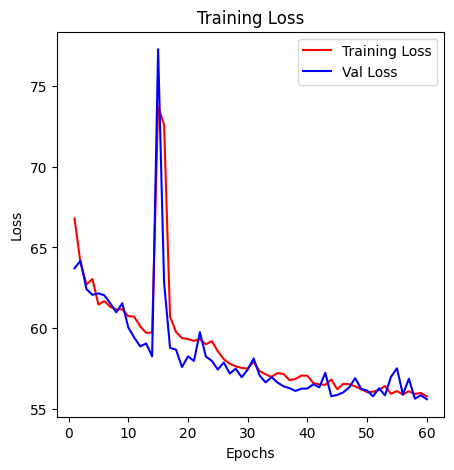

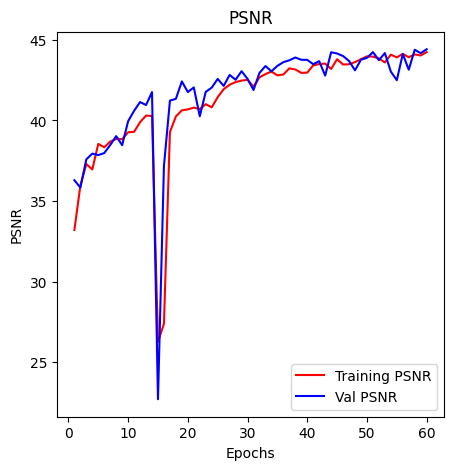

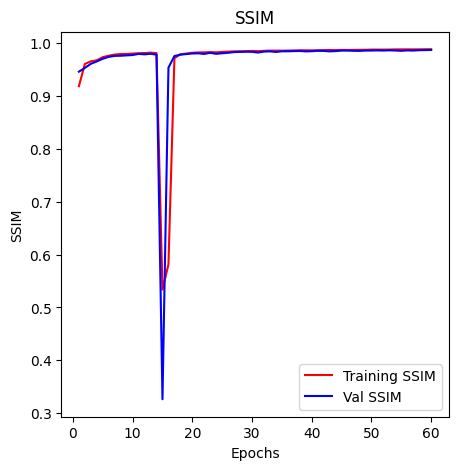

In [34]:
epochs = range(1, len(train_loss) + 1)

# Plotting train loss
plt.figure(figsize=(5, 5))
plt.plot(epochs, train_loss, 'r', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Val Loss')
plt.title('Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plotting train PSNR
plt.figure(figsize=(5, 5))
plt.plot(epochs, train_psnr, 'r', label='Training PSNR')
plt.plot(epochs, val_psnr, 'b', label='Val PSNR')
plt.title('PSNR')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.show()

# Plotting train SSIM
plt.figure(figsize=(5, 5))
plt.plot(epochs, train_ssim, 'r', label='Training SSIM')
plt.plot(epochs, val_ssim, 'b', label='Val SSIM')
plt.title('SSIM')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.show()

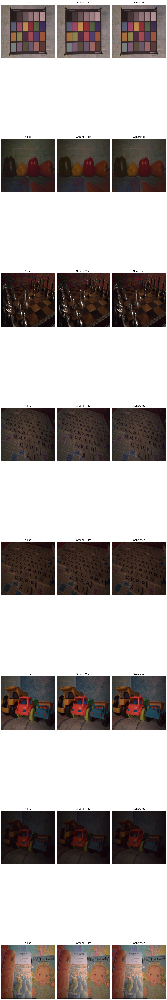

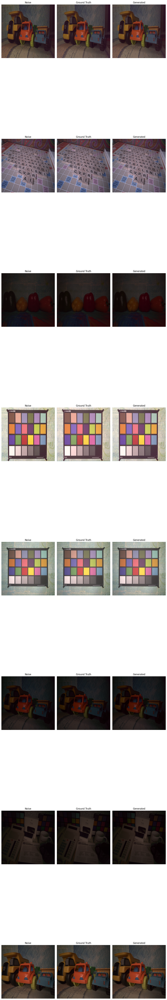

In [35]:
##### Set model to evaluation mode
from torch.autograd import Variable
model.eval()
cuda = torch.cuda.is_available()
Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor
# Iterate over a few batches from the test dataset

for batch_idx, (lr,hr) in enumerate(test_dataloader):
    # Get inputs
    imgs_lr = Variable(lr.type(Tensor))
    imgs_hr = Variable(hr.type(Tensor))

    # Forward pass: Generate high-resolution images
    with torch.no_grad():
        gen_hr = model(imgs_lr)

    # Visualize a few sample images
    num_samples = min(100, len(imgs_lr))

    fig, axes = plt.subplots(num_samples, 3, figsize=(12, num_samples * 10))
    for i in range(num_samples):
        # Original LR image
        axes[i, 0].imshow(imgs_lr[i].cpu().permute(1, 2, 0).numpy())
        axes[i, 0].set_title("Noise")
        axes[i, 0].axis("off")

        # Ground truth HR image
        axes[i, 1].imshow(imgs_hr[i].cpu().permute(1, 2, 0).numpy())
        axes[i, 1].set_title("Ground Truth")
        axes[i, 1].axis("off")

        # Generated HR image
        axes[i, 2].imshow(gen_hr[i].cpu().permute(1, 2, 0).numpy())
        axes[i, 2].set_title("Generated")
        axes[i, 2].axis("off")

    plt.tight_layout()
    plt.show()

    # Only visualize a few batches
    if batch_idx == 1:
        break

In [ ]:
# NAFNet_v4
loss, psnr, ssim = evaluate_model(model, test_dataloader)
print(f'Loss: {loss}')
print(f'PSNR: {psnr}')
print(f'SSIM: {ssim}')

Loss: 56.24465560913086
PSNR: 43.75534439086914
SSIM: 0.986481249332428
